In [4]:
# Speech separation model.
import pandas as pd
import csv
import types
import wave 
import fnmatch

import tensorflow as tf
import os
import time
import numpy as np
import matplotlib.pyplot as plt
import glob
import PIL
import imageio
from IPython import display

# 使用第一張與第三張 GPU 卡
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

#Initialize for files name and path.
base_dir = 'E:/dataset/musan'
dataset_merge_speech_name = 'merge/speech'
dataset_merge_noise_name = 'merge/noise'
dataset_merge_mix_name = 'merge/mix'
dataset_separate_speech_name = 'separation/speech'
dataset_separate_noise_name = 'separation/noise'
model_name = 'crnn_model'

dataset_merge_speech_dir = os.path.join(base_dir, dataset_merge_speech_name)
dataset_merge_noise_dir = os.path.join(base_dir, dataset_merge_noise_name)
dataset_merge_mix_dir = os.path.join(base_dir, dataset_merge_mix_name)
dataset_separate_noise_dir = os.path.join(base_dir, dataset_separate_noise_name)
if not os.path.exists(dataset_separate_noise_dir):
    os.makedirs(dataset_separate_noise_dir)
dataset_separate_speech_dir = os.path.join(base_dir, dataset_separate_speech_name)
if not os.path.exists(dataset_separate_speech_dir):
    os.makedirs(dataset_separate_speech_dir)
model_dir = os.path.join(base_dir, model_name)
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

In [2]:
# Audio parameter
channel_num = 1
sampling = 16000 #Hz
sampwidth = 2 #byte
frame_size = 256
step_ratio = 2
frame_step = frame_size // step_ratio
frame_width = 64

int2float = 32768.0
train_rate = 0.8
data_len = len(fnmatch.filter(os.listdir(dataset_merge_speech_dir), '*.wav'))
train_len = int(data_len * train_rate)
rand_data = np.random.permutation(data_len)
train_idx = rand_data[:train_len]
test_idx = rand_data[train_len:]
hann = np.hanning(frame_size) * 2.0  / int2float

train_x_dataset = []
train_y1_dataset = []
train_y2_dataset = []
test_x_dataset = []
test_y1_dataset = []
test_y2_dataset = []
total_idx = 0
start_time = time.time()

buffer_x = np.zeros((frame_size, frame_width), dtype=np.float32)
buffer_y1 = np.zeros((frame_size, frame_width), dtype=np.float32)
buffer_y2 = np.zeros((frame_size, frame_width), dtype=np.float32)
        
for idx in train_idx:
    speech_name = 'merge_speech_librivox_%05d.wav' % idx
    merge_speech_dir = os.path.join(dataset_merge_speech_dir, speech_name)
    merge_speech_wave = wave.open(merge_speech_dir, "rb")
    merge_speech_params = merge_speech_wave.getparams()
    merge_speech_nchannels, merge_speech_sampwidth, merge_speech_framerate, merge_speech_nframes = merge_speech_params[:4]
    merge_speech_strData = merge_speech_wave.readframes(merge_speech_nframes)
    merge_speech_Data = np.fromstring(merge_speech_strData, dtype=np.int16)
    merge_speech_wave.close()
    
    noise_name = 'merge_noise_librivox_%05d.wav' % idx
    merge_noise_dir = os.path.join(dataset_merge_noise_dir, noise_name)
    merge_noise_wave = wave.open(merge_noise_dir, "rb")
    merge_noise_params = merge_noise_wave.getparams()
    merge_noise_nchannels, merge_noise_sampwidth, merge_noise_framerate, merge_noise_nframes = merge_noise_params[:4]
    merge_noise_strData = merge_noise_wave.readframes(merge_noise_nframes)
    merge_noise_Data = np.fromstring(merge_noise_strData, dtype=np.int16)
    merge_noise_wave.close()
    
    frame_length = merge_speech_nframes//frame_step - step_ratio + 1
    for step in range(frame_length):
        sample = step * frame_step
        sub_idx = step % frame_width
        merge_speech_frame = merge_speech_Data[sample:sample + frame_size] // 2
        buffer_y1[:,sub_idx] = np.absolute(np.fft.fft(hann * merge_speech_frame))
        merge_noise_frame = merge_noise_Data[sample:sample + frame_size] // 2
        buffer_y2[:,sub_idx] = np.absolute(np.fft.fft(hann * merge_noise_frame))
        merge_mix_frame = merge_speech_frame + merge_noise_frame
        buffer_x[:,sub_idx] = np.absolute(np.fft.fft(hann * merge_mix_frame))
        
        if sub_idx is frame_width - 1:
            train_x_dataset.append(buffer_x + 1e-6)
            train_y1_dataset.append(buffer_y1 + 0.)
            train_y2_dataset.append(buffer_y2 + 0.)
            total_idx += 1
            print('\r', 'Training dataset generated number: %d' % total_idx, end='')
print('\n', 'Training is %d second passed... ' % (time.time() - start_time))
print('Training dataset total generated number: %d' % total_idx)

total_idx = 0
start_time = time.time()

for idx in test_idx:
    speech_name = 'merge_speech_librivox_%05d.wav' % idx
    merge_speech_dir = os.path.join(dataset_merge_speech_dir, speech_name)
    merge_speech_wave = wave.open(merge_speech_dir, "rb")
    merge_speech_params = merge_speech_wave.getparams()
    merge_speech_nchannels, merge_speech_sampwidth, merge_speech_framerate, merge_speech_nframes = merge_speech_params[:4]
    merge_speech_strData = merge_speech_wave.readframes(merge_speech_nframes)
    merge_speech_Data = np.fromstring(merge_speech_strData, dtype=np.int16)
    merge_speech_wave.close()
    
    noise_name = 'merge_noise_librivox_%05d.wav' % idx
    merge_noise_dir = os.path.join(dataset_merge_noise_dir, noise_name)
    merge_noise_wave = wave.open(merge_noise_dir, "rb")
    merge_noise_params = merge_noise_wave.getparams()
    merge_noise_nchannels, merge_noise_sampwidth, merge_noise_framerate, merge_noise_nframes = merge_noise_params[:4]
    merge_noise_strData = merge_noise_wave.readframes(merge_noise_nframes)
    merge_noise_Data = np.fromstring(merge_noise_strData, dtype=np.int16)
    merge_noise_wave.close()
    
    frame_length = merge_speech_nframes//frame_step - step_ratio + 1
    for step in range(frame_length):
        sample = step * frame_step
        sub_idx = step % frame_width
        merge_speech_frame = merge_speech_Data[sample:sample + frame_size] // 2
        buffer_y1[:,sub_idx] = np.absolute(np.fft.fft(hann * merge_speech_frame))
        merge_noise_frame = merge_noise_Data[sample:sample + frame_size] // 2
        buffer_y2[:,sub_idx] = np.absolute(np.fft.fft(hann * merge_noise_frame))
        merge_mix_frame = merge_speech_frame + merge_noise_frame
        buffer_x[:,sub_idx] = np.absolute(np.fft.fft(hann * merge_mix_frame))
        
        if sub_idx is frame_width - 1:
            test_x_dataset.append(buffer_x + 1e-6)
            test_y1_dataset.append(buffer_y1 + 0.)
            test_y2_dataset.append(buffer_y2 + 0.)
            total_idx += 1
            print('\r', 'Testing dataset generated number: %d' % total_idx, end='')
print('\n', 'Testing is %d second passed... ' % (time.time() - start_time))
print('Testing dataset total generated number: %d' % total_idx)

C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:51: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


 Training dataset generated number: 89668
 Training is 3179 second passed... 
Training dataset total generated number: 89668


C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:93: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


 Testing dataset generated number: 22212
 Testing is 1085 second passed... 
Testing dataset total generated number: 22212


In [6]:
frame_width_q = frame_width//4
frame_size_q = frame_size//4

class CNN(tf.keras.Model):
    def __init__(self, batch_size):
        super(CNN, self).__init__()
        self.batch_size = batch_size
        self.inference_net = tf.keras.Sequential(
            [
            tf.keras.layers.InputLayer(input_shape=(frame_size, frame_width, 1), dtype=tf.float64),
            tf.keras.layers.Conv2D(
                filters=32, kernel_size=3, strides=(2, 2), padding='same', activation='relu'),
            tf.keras.layers.Conv2D(
                filters=32, kernel_size=3, strides=(2, 2), padding='same', activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(units=frame_size_q*frame_width_q*2, activation=tf.nn.relu),
            tf.keras.layers.Reshape(target_shape=(frame_size_q, frame_width_q, 2)),
            ]
        )

        self.generative1_net = tf.keras.Sequential(
            [
            tf.keras.layers.InputLayer(input_shape=(frame_size_q, frame_width_q, 1), dtype=tf.float64),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=(2, 2), padding="SAME", activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=(2, 2), padding="SAME", activation='relu'),
            # No activation
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=(1, 1), padding="SAME"),
            ]
        )
        
        self.generative2_net = tf.keras.Sequential(
            [
            tf.keras.layers.InputLayer(input_shape=(frame_size_q, frame_width_q, 1), dtype=tf.float64),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=(2, 2), padding="SAME", activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=(2, 2), padding="SAME", activation='relu'),
            # No activation
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=(1, 1), padding="SAME"),
            ]
        )
    def noise_reduction(self, x):
        y_merge = self.inference_net(x)
        y_shape = tf.shape(y_merge)
        slice_shape = [y_shape[0], y_shape[1], y_shape[2], 1]
        y1 = self.generative1_net(tf.slice(y_merge,[0, 0, 0, 0], slice_shape))
        y2 = self.generative2_net(tf.slice(y_merge,[0, 0, 0, 1], slice_shape))
        return y1, y2

In [7]:
optimizer = tf.keras.optimizers.Adam(1e-4)
gamma = 0.01

def compute_loss(model, x, y1, y2):
    y1_out, y2_out = model.noise_reduction(x)
    
    return tf.reduce_mean(tf.square(y1_out - y1) + tf.square(y2_out - y2) - gamma * (tf.square(y2_out - y1) + tf.square(y1_out - y2)))

def compute_gradients(model, x, y1, y2):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, x, y1, y2)
    return tape.gradient(loss, model.trainable_variables), loss

def apply_gradients(optimizer, gradients, variables):
    optimizer.apply_gradients(zip(gradients, variables))

 Epoch 1 , loss 1.665289 , 3650 sec (99%).
 Epoch: 1, Test set ELBO: 1.1567697525024414, time elapse for current epoch 4338.729040384293[s]



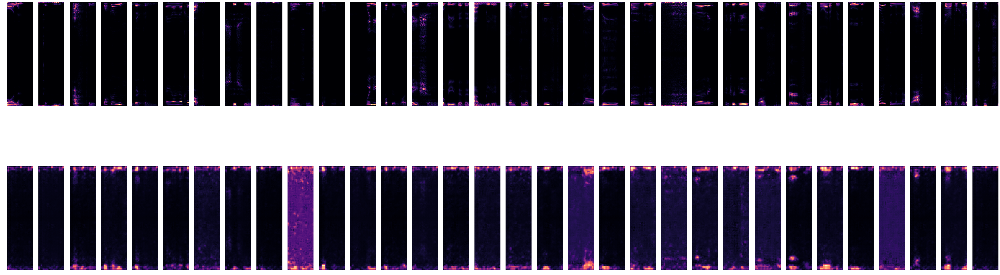

 Epoch 2 , loss 0.732403 , 4173 sec (99%).
 Epoch: 2, Test set ELBO: 1.052869200706482, time elapse for current epoch 4776.303204774857[s]



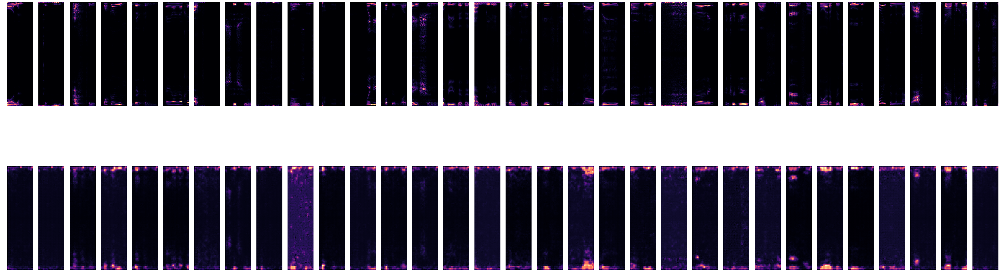

 Epoch 3 , loss 0.837852 , 4197 sec (99%).
 Epoch: 3, Test set ELBO: 0.9821503758430481, time elapse for current epoch 4881.8111436367035[s]



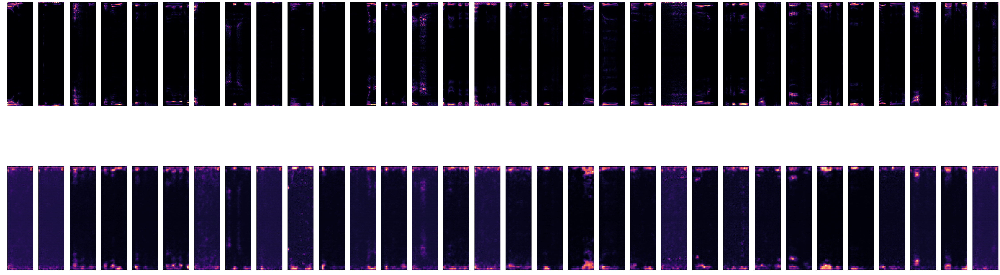

 Epoch 4 , loss 0.848562 , 4570 sec (99%).
 Epoch: 4, Test set ELBO: 0.942643404006958, time elapse for current epoch 5323.78049492836[s]



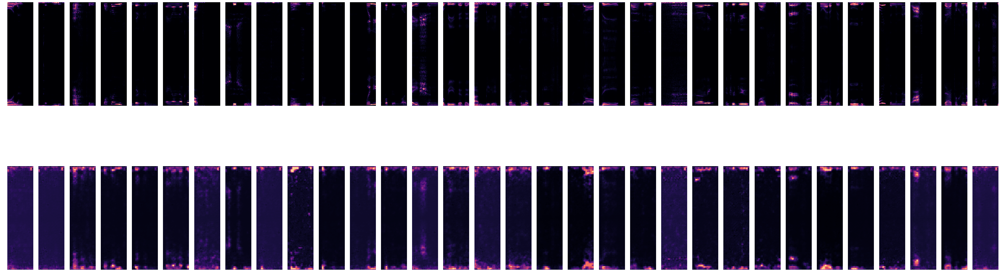

 Epoch 5 , loss 0.762469 , 4032 sec (99%).
 Epoch: 5, Test set ELBO: 0.9164295196533203, time elapse for current epoch 4755.103194475174[s]



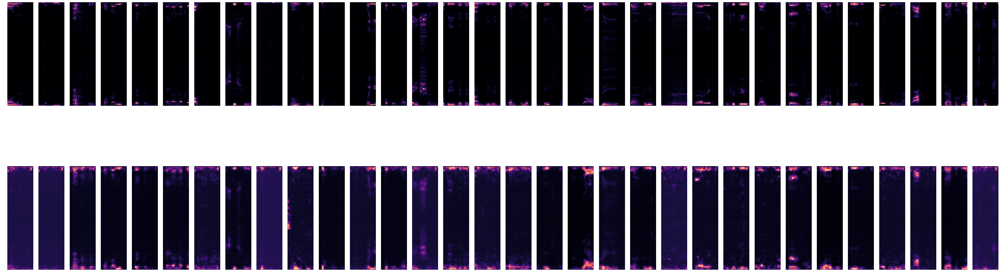

 Epoch 6 , loss 1.027393 , 3945 sec (99%).
 Epoch: 6, Test set ELBO: 0.9001120924949646, time elapse for current epoch 4608.746327877045[s]



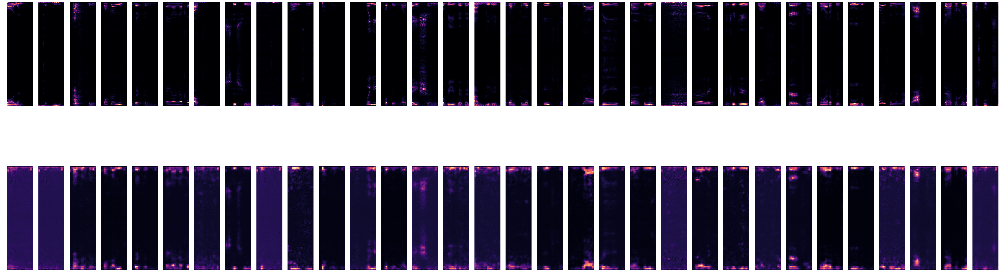

 Epoch 7 , loss 0.944601 , 4055 sec (99%).
 Epoch: 7, Test set ELBO: 0.8798641562461853, time elapse for current epoch 4747.668001413345[s]



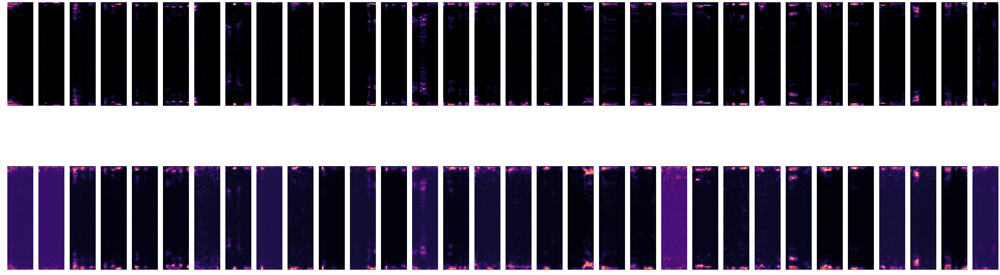

 Epoch 8 , loss 0.725103 , 4210 sec (99%).
 Epoch: 8, Test set ELBO: 0.8638693690299988, time elapse for current epoch 4990.210311174393[s]



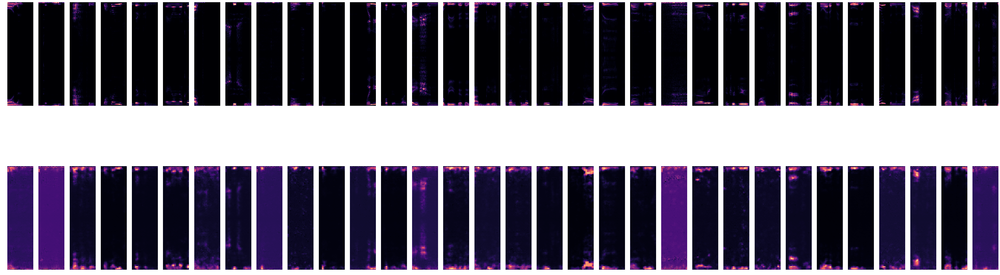

 Epoch 9 , loss 1.028299 , 4051 sec (99%).
 Epoch: 9, Test set ELBO: 0.8532810807228088, time elapse for current epoch 4708.689890623093[s]



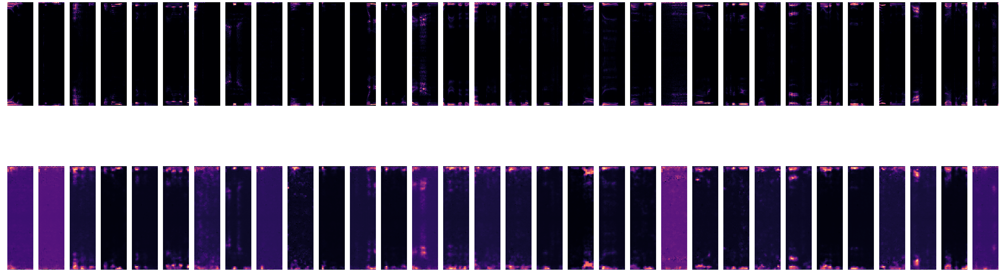

 Epoch 10 , loss 0.856460 , 3986 sec (99%).
 Epoch: 10, Test set ELBO: 0.8427656888961792, time elapse for current epoch 4675.169880628586[s]



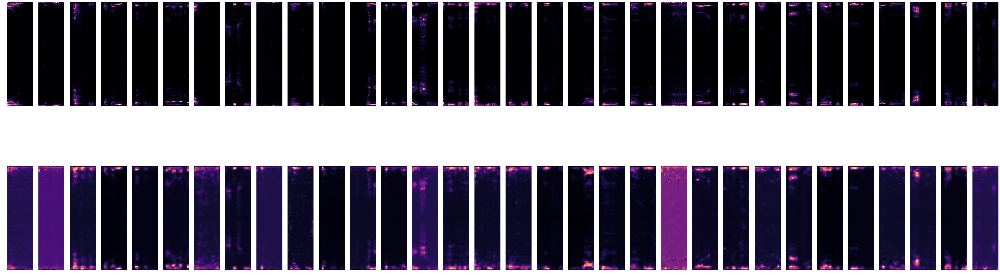

In [5]:
epochs = 10
batch_size = 64
examples_num = 32

training_num = len(train_x_dataset)
training_times = training_num//batch_size
training_perc = training_times//100
testing_num = len(test_x_dataset)
testing_times = testing_num//batch_size
testing_perc = testing_times//100
#model = CVAE(latent_dim, batch_size)
model = CNN(batch_size)

def generate_and_save_images(model, epoch, test_input, test_target):
    predictions, _ = model.noise_reduction(test_input)
    fig = plt.figure(figsize=(80, 25))

    for i in range(predictions.shape[0]):
        plt.subplot(2, examples_num, i + 1)
        plt.imshow(test_target[i, :, :, 0], cmap='magma')
        plt.axis('off')
        plt.subplot(2, examples_num, examples_num + i + 1)
        plt.imshow(predictions[i, :, :, 0], cmap='magma')
        plt.axis('off')

    # tight_layout minimizes the overlap between 2 sub-plots
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

batch_buffer_x = np.zeros((batch_size, frame_size, frame_width, 1), dtype=np.float64)
batch_buffer_y1 = np.zeros((batch_size, frame_size, frame_width, 1), dtype=np.float64)
batch_buffer_y2 = np.zeros((batch_size, frame_size, frame_width, 1), dtype=np.float64)
testing_rand = np.random.permutation(testing_num)

for epoch in range(1, epochs + 1):
    start_time = time.time()
    training_rand = np.random.permutation(training_num)
    rand_idx = 0
    for times in range(training_times):
        for idx in range(batch_size):
            batch_buffer_x[idx,:,:,0] = train_x_dataset[training_rand[rand_idx]]
            batch_buffer_y1[idx,:,:,0] = train_y1_dataset[training_rand[rand_idx]]
            batch_buffer_y2[idx,:,:,0] = train_y2_dataset[training_rand[rand_idx]]
            rand_idx += 1
        gradients, loss = compute_gradients(model, batch_buffer_x, batch_buffer_y1, batch_buffer_y2)
        apply_gradients(optimizer, gradients, model.trainable_variables)
        if ((times+1) % training_perc) is 0 or (times+1) is training_times:
            print('\r', 
                  'Epoch %d' % epoch,
                  ', loss %f' % loss,
                  ', %d sec' % (time.time() - start_time),
                  '(%d%%).' % (100.0*(times+1)/training_times),
                  end='')
    
    model.save_weights('./weights/my_model_%0d' % epoch)
    
    if epoch % 1 == 0:
        loss = tf.keras.metrics.Mean()
        rand_idx = 0
        for times in range(testing_times):
            for idx in range(batch_size):
                batch_buffer_x[idx,:,:,0] = test_x_dataset[testing_rand[rand_idx]]
                batch_buffer_y1[idx,:,:,0] = test_y1_dataset[testing_rand[rand_idx]]
                batch_buffer_y2[idx,:,:,0] = test_y2_dataset[testing_rand[rand_idx]]
                rand_idx += 1
            loss(compute_loss(model, batch_buffer_x, batch_buffer_y1, batch_buffer_y2))
        elbo = loss.result()
        #display.clear_output(wait=False)
        print('\n', 
              'Epoch: {}, Test set ELBO: {}, time elapse for current epoch {}[s]\n'.format(epoch,
                                                                                           elbo,
                                                                                           time.time()-start_time))
        generate_and_save_images(
            model, epoch, batch_buffer_x[:examples_num,:,:,0:1], batch_buffer_y1[:examples_num,:,:,0:1])

In [19]:
ii = 10
print(train_y1_dataset[ii][0,0],train_y2_dataset[ii][0,0],train_x_dataset[ii][0,0],(train_y1_dataset[ii]/(train_x_dataset[ii] + 1e-6))[0,0])
#print(test_y1_dataset[ii][0,0],test_y2_dataset[ii][0,0],test_x_dataset[ii][0,0],(test_y1_dataset[ii]/(test_x_dataset[ii] + 1e-6))[0,0])
ii = 20
print(train_y1_dataset[ii][0,0],train_y2_dataset[ii][0,0],train_x_dataset[ii][0,0],(train_y1_dataset[ii]/(train_x_dataset[ii] + 1e-6))[0,0])
#print(test_y1_dataset[ii][0,0],test_y2_dataset[ii][0,0],test_x_dataset[ii][0,0],(test_y1_dataset[ii]/(test_x_dataset[ii] + 1e-6))[0,0])

0.17969675 0.3218423 0.50154006 0.3582892
0.14741968 0.6846885 0.53726983 0.27438614


In [12]:
# Audio parameter
channel_num = 1
sampling = 16000 #Hz
sampwidth = 2 #byte
frame_size = 256
step_ratio = 2
frame_step = frame_size // step_ratio
frame_width = 64

int2float = 32768.0
train_rate = 0.8
data_len = len(fnmatch.filter(os.listdir(dataset_merge_speech_dir), '*.wav'))
train_len = int(data_len * train_rate)
rand_data = np.random.permutation(data_len)
train_idx = rand_data[:train_len]
test_idx = rand_data[train_len:]
hann = np.hanning(frame_size) * 2.0  / int2float

sim_step_ratio = 2
frame_sim_step = frame_size // sim_step_ratio
buffer_x_abs = np.zeros((frame_size, frame_width), dtype=np.float64)
buffer_x_ang = np.zeros((frame_size, frame_width), dtype=np.complex128)
hann_out = np.hanning(frame_size) * int2float / 1.5
sub_speech_idx = 0

end_epoch = 10
model = CNN(1)
model.load_weights('./weights/my_model_%0d' % end_epoch)

for idx in test_idx:
    mix_name = 'mix_librivox_%05d.wav' % idx
    merge_mix_dir = os.path.join(dataset_merge_mix_dir, mix_name)
    merge_mix_wave = wave.open(merge_mix_dir, "rb")
    merge_mix_params = merge_mix_wave.getparams()
    merge_mix_nchannels, merge_mix_sampwidth, merge_mix_framerate, merge_mix_nframes = merge_mix_params[:4]
    merge_mix_strData = merge_mix_wave.readframes(merge_mix_nframes)
    merge_mix_Data = np.fromstring(merge_mix_strData, dtype=np.int16)
    merge_mix_wave.close()
    
    separate_speech_Data = np.zeros(merge_mix_Data.shape, dtype=np.int16)
    separate_noise_Data = np.zeros(merge_mix_Data.shape, dtype=np.int16)
        
    frame_length = merge_mix_nframes//frame_sim_step - sim_step_ratio + 1
    sample_str = 0
    for step in range(frame_length):
        sample = step * frame_sim_step
        sub_idx = step % frame_width
        merge_mix_frame = merge_mix_Data[sample:sample + frame_size]
        mix_sp = np.fft.fft(hann * merge_mix_frame)
        buffer_x_abs[:,sub_idx] = np.absolute(mix_sp)
        buffer_x_ang[:,sub_idx] = mix_sp / buffer_x_abs[:,sub_idx]
        
        if sub_idx is frame_width - 1:
            y1_abs, y2_abs = model.noise_reduction(buffer_x_abs.reshape([1, frame_size, frame_width, 1]))
            y1_out = tf.reshape(y1_abs, [frame_size, frame_width]) * buffer_x_ang
            y2_out = tf.reshape(y2_abs, [frame_size, frame_width]) * buffer_x_ang
            y1_f = np.fft.ifft(y1_out, axis=0)
            y2_f = np.fft.ifft(y2_out, axis=0)
            for oStep in range(frame_width):
                separate_speech_Data[sample_str: sample_str + frame_size] += (hann_out * y1_f[:, oStep]).real.astype(np.int16)
                separate_noise_Data[sample_str: sample_str + frame_size] += (hann_out * y2_f[:, oStep]).real.astype(np.int16)
                sample_str += frame_sim_step
            
    #打開WAV文檔
    #speech_basename = os.path.basename(speech_name)
    speech_basename = 'librivox'

    #切割後的speech
    separate_speech_name = 'separate_speech_' + speech_basename + '_%05d' % sub_speech_idx + '.wav'
    separate_speech_dir = os.path.join(dataset_separate_speech_dir, separate_speech_name)
    separate_speech_wave = wave.open(separate_speech_dir, "wb")
    #配置聲道數、量化位數和取樣頻率
    separate_speech_wave.setnchannels(merge_mix_nchannels) 
    separate_speech_wave.setsampwidth(merge_mix_sampwidth) 
    separate_speech_wave.setframerate(merge_mix_framerate) 
    #將wav_data轉換為二進制數據寫入文件
    separate_speech_wave.writeframes(separate_speech_Data.tostring()) 
    separate_speech_wave.close()

    #切割後的noise
    separate_noise_name = 'merge_noise_' + speech_basename + '_%05d' % sub_speech_idx + '.wav'
    separate_noise_dir = os.path.join(dataset_separate_noise_dir, separate_noise_name)
    separate_noise_wave = wave.open(separate_noise_dir, "wb")
    #配置聲道數、量化位數和取樣頻率
    separate_noise_wave.setnchannels(merge_mix_nchannels) 
    separate_noise_wave.setsampwidth(merge_mix_sampwidth) 
    separate_noise_wave.setframerate(merge_mix_framerate) 
    #將wav_data轉換為二進制數據寫入文件
    separate_noise_wave.writeframes(separate_noise_Data.tostring()) 
    separate_noise_wave.close()

    sub_speech_idx += 1

C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
